# Prerequisites
This section installs `gradslam` (if not already installed) and downloads the `lr kt1` (the first trajectory) of [ICL-NUIM dataset](https://www.doc.ic.ac.uk/~ahanda/VaFRIC/iclnuim.html) and structures it as below:
```
ICL
    living_room_traj1_frei_png
        depth/    rgb/    associations.txt    livingRoom1.gt.freiburg    livingRoom1n.gt.sim
```

In [ ]:
import os

# install gradslam (if not installed)
try:
    import gradslam as gs
except ImportError:
    print("Installing gradslam...")
    !pip install 'git+https://github.com/gradslam/gradslam.git' -q
    print('Installed')

# download 'lr kt1' of ICL dataset
if not os.path.isdir('ICL'):
    os.mkdir('ICL')
if not os.path.isdir('ICL/living_room_traj1_frei_png'):
    print('Downloading ICL/living_room_traj1_frei_png dataset...')
    os.mkdir('ICL/living_room_traj1_frei_png')
    !wget http://www.doc.ic.ac.uk/~ahanda/living_room_traj1_frei_png.tar.gz -P ICL/living_room_traj1_frei_png/ -q
    !tar -xzf ICL/living_room_traj1_frei_png/living_room_traj1_frei_png.tar.gz -C ICL/living_room_traj1_frei_png/
    !rm ICL/living_room_traj1_frei_png/living_room_traj1_frei_png.tar.gz
    !wget https://www.doc.ic.ac.uk/~ahanda/VaFRIC/livingRoom1n.gt.sim -P ICL/living_room_traj1_frei_png/ -q
    print('Downloaded.')
icl_path = 'ICL/'

Installing gradslam...
     |████████████████████████████████| 225kB 10.2MB/s 
     |████████████████████████████████| 13.2MB 253kB/s 
     |████████████████████████████████| 4.6MB 52.6MB/s 
     |████████████████████████████████| 36.7MB 82kB/s 
Installed
Downloaded.


# Imports

In [ ]:
import cv2
import gradslam as gs
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil
import torch
from chamferdist.chamfer import knn_points
from gradslam import Pointclouds, RGBDImages
from gradslam.datasets import ICL
from gradslam.slam import PointFusion
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm

# Load Dataset
Load the first 4 frames of `icl/living_room_traj1_frei_png`, store them in `rgbdimages`, and visualize them.


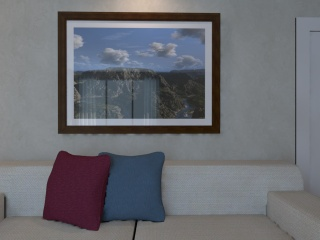
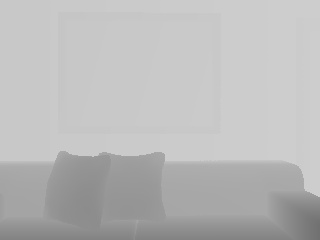
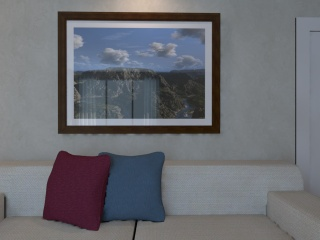
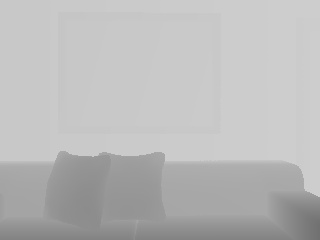
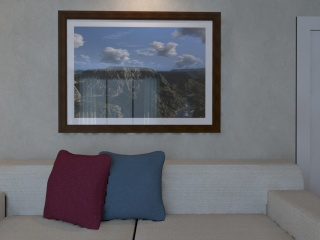
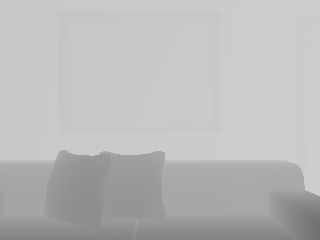
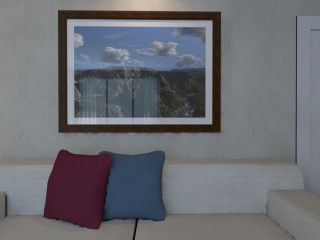
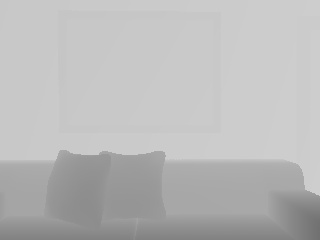
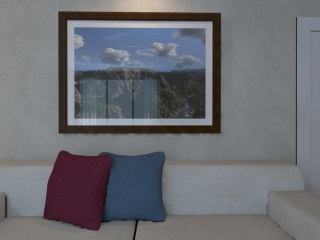
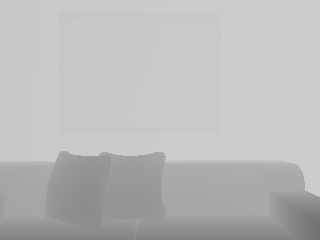

In [ ]:
# load dataset
dataset = ICL(icl_path, seqlen=4, height=240, width=320)
loader = DataLoader(dataset=dataset, batch_size=1)
colors, depths, intrinsics, poses, *_ = next(iter(loader))
colors /= 255

# create rgbdimages object
rgbdimages = RGBDImages(colors, depths, intrinsics, poses)
rgbdimages.plotly(0).update_layout(autosize=False, height=600, width=400).show()

# Groundtruth Reconstruction

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
slam = PointFusion(device=device, odom='gt')
gt_global_map, _ = slam(rgbdimages)
gt_global_map.plotly(0).show()

# Corrupted Reconstruction

In [ ]:
def get_corrupted_rgbdimages():
    pert_depths = depths.clone()
    pert_colors = colors.clone()

    mu = torch.mean(pert_depths)
    std = torch.std(pert_depths)

    pert_depths[:, -1, ...] = (torch.rand(1, 240, 320, 1).to(device) * std) + mu
    pert_colors[:, -1, ...] = torch.rand(1, 240, 320, 3).to(device)

    # Turn requires_grad on for colors/depths
    pert_depths.requires_grad_().retain_grad()
    pert_colors.requires_grad_().retain_grad()

    return RGBDImages(pert_colors, pert_depths, intrinsics, poses)

pert_rgbdimages = get_corrupted_rgbdimages()
slam(pert_rgbdimages)[0].plotly(0).show()

# Optimize Input

In [ ]:
if os.path.exists('images'):
    shutil.rmtree('images')
os.mkdir('images')

def convert_seq_to_one(image_tensor, denormalize=False, SCHW=True):
    r"""Converts sequence of images into one image for visualization
    Args:
        image_tensor (torch.Tensor): (of shape: [S, C, H, W] OR [S, H, W, C])
        denormalize (bool, Optional): If ``True``, will multiply image_tensor
                                      values by 255.
    """
    if SCHW:
        seq_len, C, H, W = image_tensor.shape
        image_tensor = image_tensor.permute(2, 0, 3, 1).contiguous()
    else:
        seq_len, H, W, C = image_tensor.shape
        image_tensor = image_tensor.permute(1, 0, 2, 3).contiguous()
        
    if denormalize:
        image_tensor = image_tensor * 255
    
    image_tensor = image_tensor.view(H, -1, C)
    image = image_tensor.detach().cpu().numpy().astype(np.uint8)
    return image

def custom_slam(rgbdimages):
    r"""
    Performs SLAM on the sequence of frames in the input rgbdimages.
    Keeps gradients on for the final frame, and detaches the gradients
    for all previous frames in the sequence (as they were uncorrupted 
    ground truth frames)
    """
    pointclouds = Pointclouds(device=device)
    batch_size, seq_len = rgbdimages.shape[:2]
    initial_poses = torch.eye(4, device=device).view(1, 1, 4, 4).repeat(batch_size, 1, 1, 1)
    prev_frame = None
    for s in range(seq_len):
        live_frame = rgbdimages[:, s].to(device)
        live_frame = live_frame.detach() if s < seq_len - 1 else live_frame
        if s == 0 and live_frame.poses is None:
            live_frame.poses = initial_poses
        pointclouds, live_frame.poses = slam.step(pointclouds, live_frame)
        live_frame.poses = live_frame.poses.detach()
    return pointclouds

def loss_fn(gt_cloud, gt_pc_color, pert_cloud, pert_pc_color):
    # dist1: distance between closest points between clouds
    # idx1: index of gt_cloud's closest points to pert_cloud's points
    _KNN = knn_points(pert_cloud, gt_cloud)
    dist1, idx1 = _KNN.dists.squeeze(-1), _KNN.idx.squeeze(-1).detach()

    cloud_loss = dist1.mean()
    color_loss = ((pert_pc_color[0] - gt_pc_color[0, idx1[0].long()]).abs().mean())

    return cloud_loss, color_loss

pert_rgbdimages = get_corrupted_rgbdimages()
pert_depths = pert_rgbdimages.depth_image
pert_colors = pert_rgbdimages.rgb_image
lr = 5e-2
momentum = 0.9
optimizer = torch.optim.Adam([pert_depths, pert_colors], lr=lr)
gt_cloud = gt_global_map.points_list[0].unsqueeze(0).contiguous().detach().to(device)
gt_pc_color = gt_global_map.colors_list[0].unsqueeze(0).contiguous().detach().to(device)

for i in tqdm(range(80), desc='train'):
    pert_global_map = custom_slam(pert_rgbdimages)
    pert_cloud = pert_global_map.points_list[0].unsqueeze(0).contiguous()
    pert_pc_color = pert_global_map.colors_list[0].unsqueeze(0).contiguous()

    cloud_loss, color_loss = loss_fn(gt_cloud, gt_pc_color, pert_cloud, pert_pc_color)
    loss = cloud_loss + color_loss

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # save rgbdimages visualization
    rgb_image = convert_seq_to_one(pert_colors[0], True, SCHW=False)
    depth_image = convert_seq_to_one(pert_depths[0].repeat(1,1,1,3) / torch.max(depths), True, SCHW=False)
    image = np.concatenate([rgb_image, depth_image], 0)
    imageio.imwrite(os.path.join(f'images/{i:03d}.jpg'), image)

    if i % 10 == 0:
        tqdm.write("Cloud Loss {:.6f}, Color Loss {:.6f}".format(cloud_loss, color_loss))

Cloud Loss 0.015578, Color Loss 0.130226
Cloud Loss 0.002209, Color Loss 0.034147
Cloud Loss 0.002031, Color Loss 0.024020
Cloud Loss 0.001832, Color Loss 0.015465
Cloud Loss 0.001705, Color Loss 0.011837
Cloud Loss 0.001679, Color Loss 0.009619
Cloud Loss 0.001690, Color Loss 0.008625
Cloud Loss 0.001699, Color Loss 0.007956



# Convert result to video and show

In [ ]:
! ffmpeg -loglevel panic -framerate 10 -i images/%03d.jpg -c:v libx264 -pix_fmt yuv420p optimization_video.mp4

In [ ]:
# https://stackoverflow.com/questions/57377185/how-play-mp4-video-in-google-colab

from IPython.display import HTML
from base64 import b64encode
mp4 = open('optimization_video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""<video width=400 controls> <source src="%s" type="video/mp4"> </video>""" % data_url)